# USD

## Plot results

In [5]:
import os
from pathlib import Path
from typing import List

from plot import make_plots

dir_path = os.path.abspath('')
results_dir = 'data'
all_experiments = [name for name in os.listdir(os.path.join(dir_path, '..',  results_dir))]

# Create plots dir
plots_dir = '../plots'
Path(plots_dir).mkdir(parents=True, exist_ok=True)

In [6]:
def get_labels(
    dirs: List[str],
    main_split_separator: str = 'half-cheetah_halfcheetah-v2_',
    params_split_separator: str = '_',
    decimal_separator: str = '-',
) -> List[str]:
    labels = []
    for dir in dirs:
        gamma, clip, target_kl = dir.split(main_split_separator)[1].split(
            params_split_separator)
        gamma = gamma[3:].replace(decimal_separator, '.')
        clip = clip[3:].replace(decimal_separator, '.')
        target_kl = target_kl[3:].replace(decimal_separator, '.')
        title = f'gamma={gamma}, clip_ratio={clip}, targe_kl={target_kl}'
        labels.append(title)
    return labels

#### PyTorch results

In [7]:
pytorch_dirs = [os.path.join(dir_path, '..',  results_dir, dir) for dir in all_experiments if 'pyt' in dir]
pytorch_labels = get_labels(pytorch_dirs)

/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


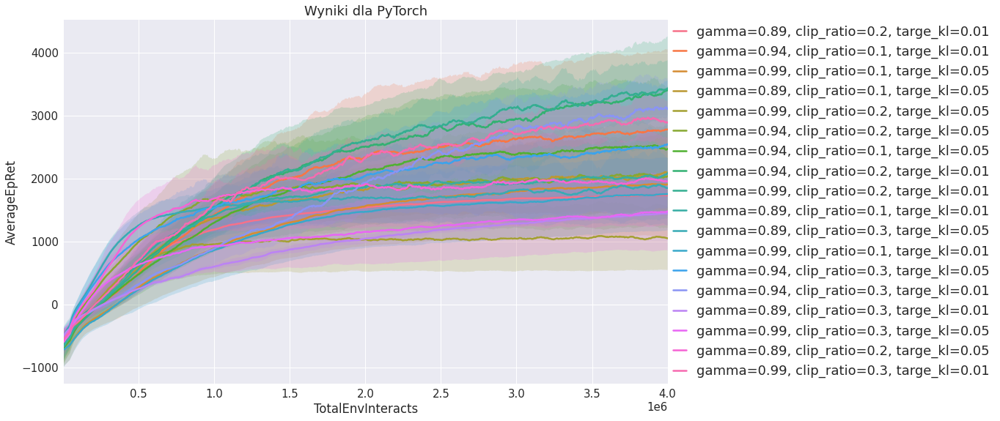

In [8]:
make_plots(all_logdirs=pytorch_dirs, legend=pytorch_labels, smooth=20, title='Wyniki dla PyTorch', figsize=(19, 8), file_name=f'{plots_dir}/spinningup_tensorflow_all.png')

#### Tensorflow results

In [9]:
tf_dirs = [os.path.join(dir_path, '..',  results_dir, dir) for dir in all_experiments if 'tf1' in dir]
tf_labels =  get_labels(tf_dirs)

/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


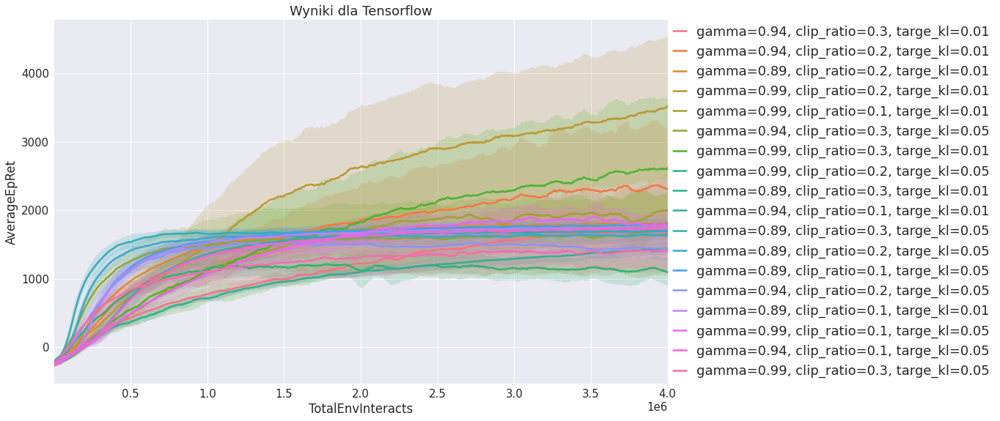

In [10]:
make_plots(all_logdirs=tf_dirs, legend=tf_labels, smooth=20, title='Wyniki dla Tensorflow', figsize=(19, 8), file_name=f'{plots_dir}/spinningup_pytorch_all.png')

#### RLlib results

In [11]:
rllib_dirs = [
    os.path.join(dir_path, '..', results_dir, dir) for dir in all_experiments
    if 'ppo-rllib' in dir
]
rllib_labels =  get_labels(rllib_dirs)


No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file name

/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


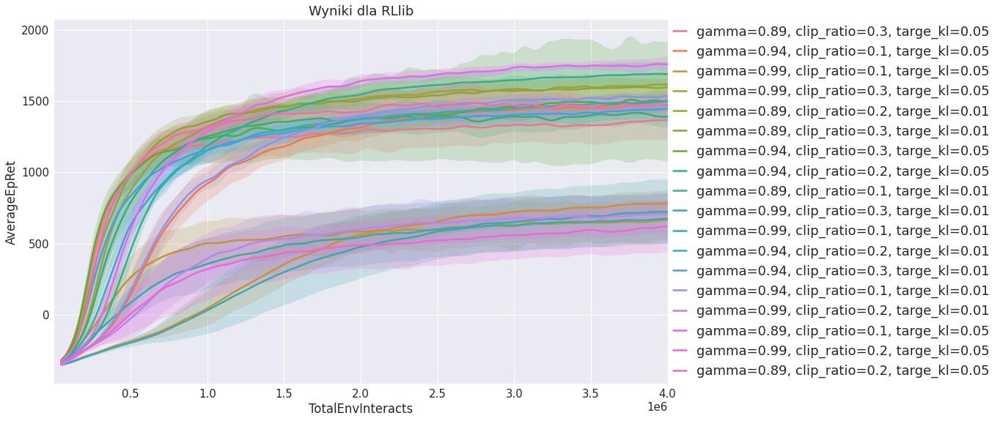

In [12]:
make_plots(all_logdirs=rllib_dirs, legend=rllib_labels, smooth=20, title='Wyniki dla RLlib', figsize=(19, 8), file_name=f'{plots_dir}/rllib_all.png')

#### Comparison between frameworks

In [13]:

def plot_experiment(name: str) -> None:
    gamma, clip, target_kl = name.split('_')
    gamma = gamma[3:].replace('-', '.')
    clip = clip[3:].replace('-', '.')
    target_kl = target_kl[3:].replace('-', '.')
    title = f'Eksperyment - gamma={gamma}, clip_ratio={clip}, targe_kl={target_kl}'

    tf_experiment_dir = [ex_dir for ex_dir in tf_dirs if name in ex_dir]
    assert len(tf_experiment_dir) == 1
    pyt_experiment_dir = [ex_dir for ex_dir in pytorch_dirs if name in ex_dir]
    assert len(pyt_experiment_dir) == 1
    tf_experiment_dir = [ex_dir for ex_dir in tf_dirs if name in ex_dir]
    assert len(tf_experiment_dir) == 1
    rllib_experiment_dir = [ex_dir for ex_dir in rllib_dirs if name in ex_dir]
    assert len(rllib_experiment_dir) == 1
    exp_dirs = [
        tf_experiment_dir[0],
        pyt_experiment_dir[0],
        rllib_experiment_dir[0],
    ]
    exp_labels = ['Tensorflow', 'PyTorch', 'RLlib']

    plot_dir = f"{plots_dir}/{gamma.replace('.', '_')}"
    Path(plot_dir).mkdir(parents=True, exist_ok=True)
    make_plots(all_logdirs=exp_dirs, legend=exp_labels, smooth=20, title=title, file_name=f'{plot_dir}/{name}.png')

No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json


/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


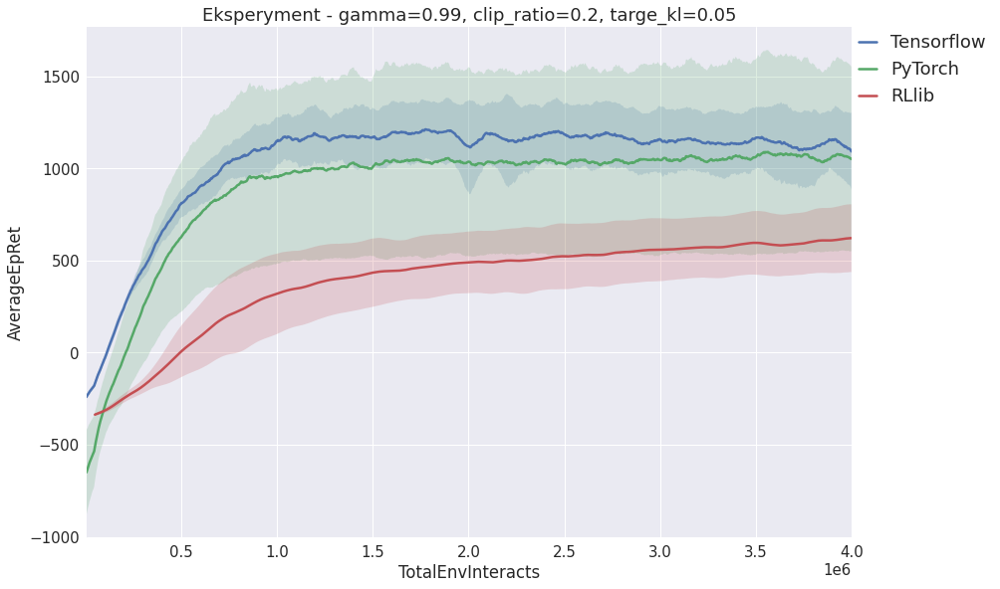

No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json


/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


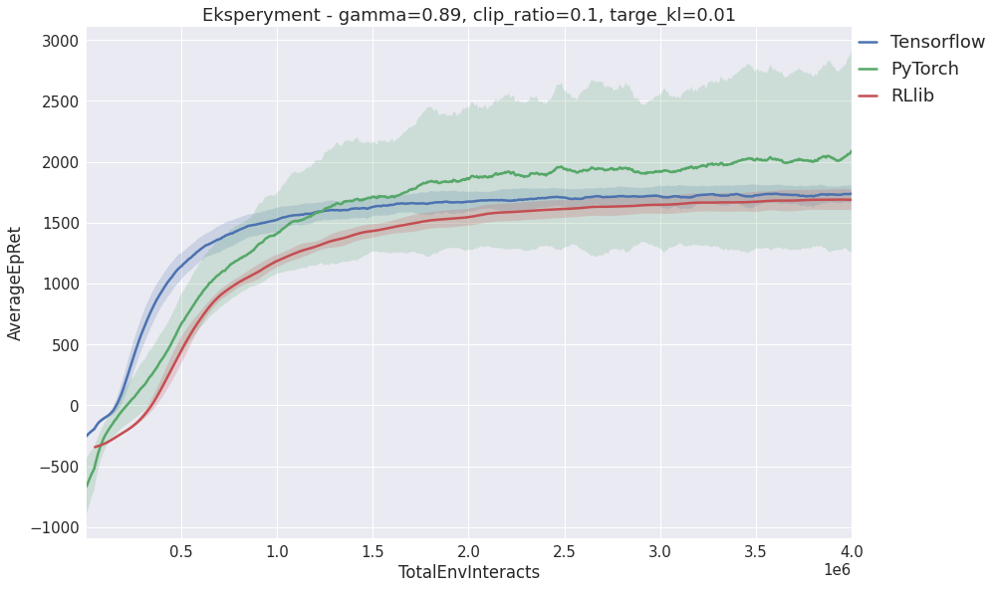

No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json


/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


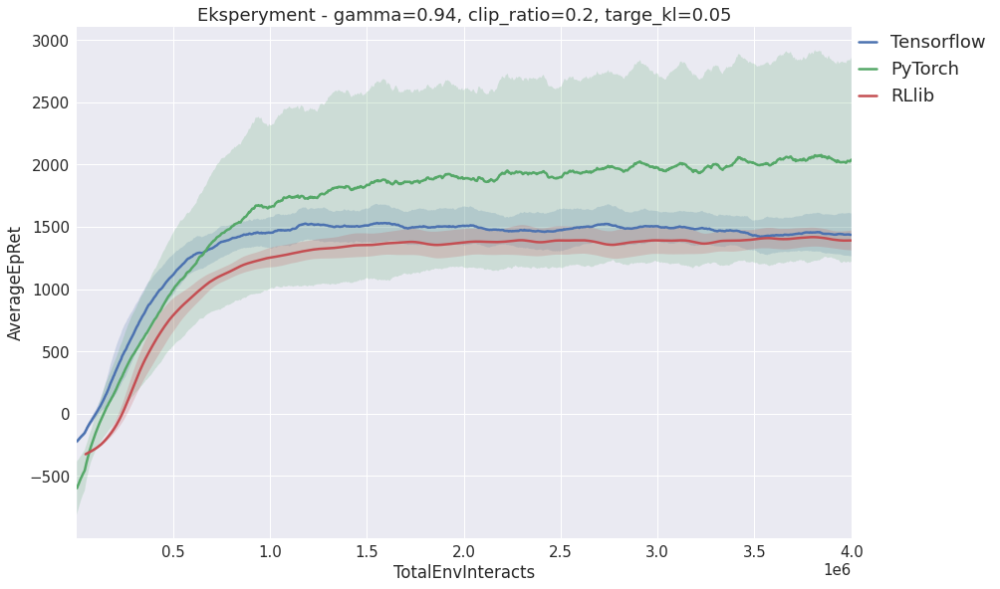

No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json


/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


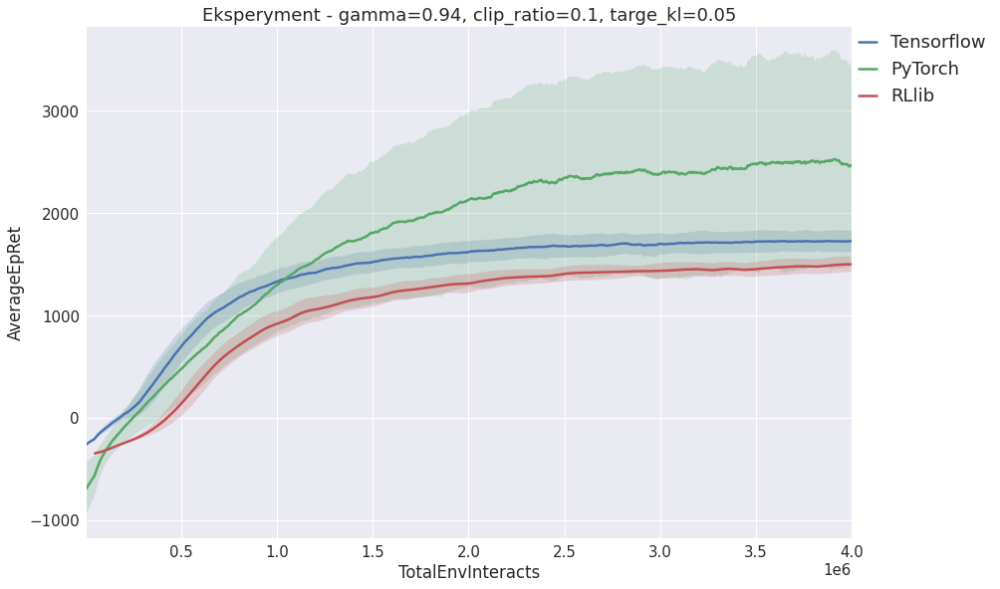

No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json


/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


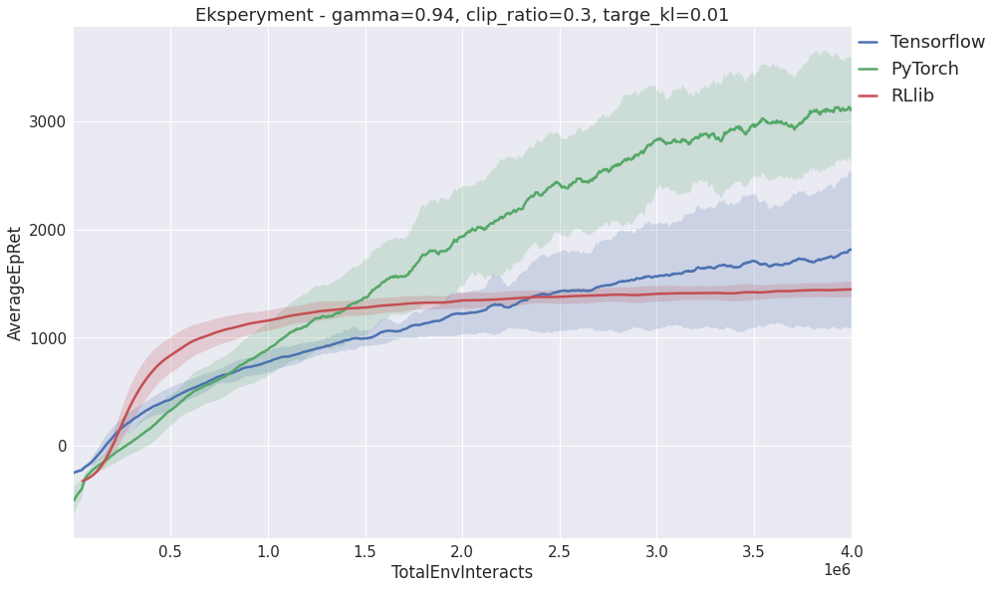

No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json


/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


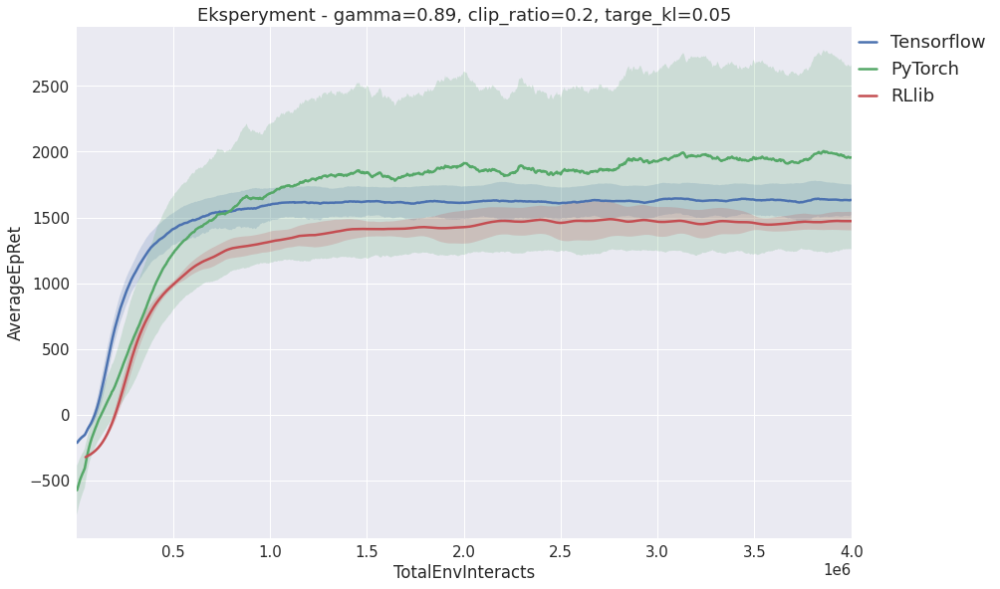

No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json


/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


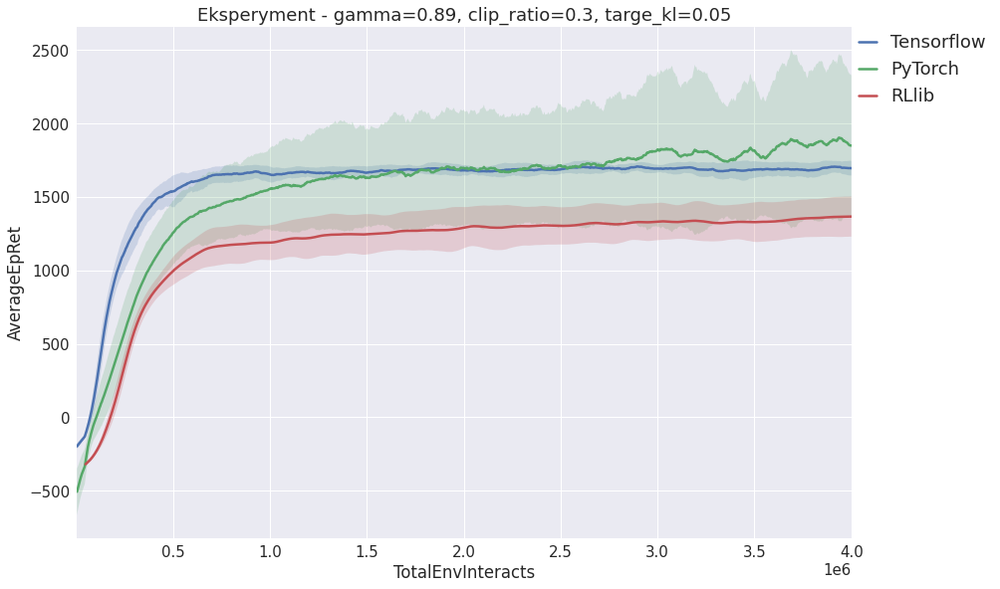

No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json


/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


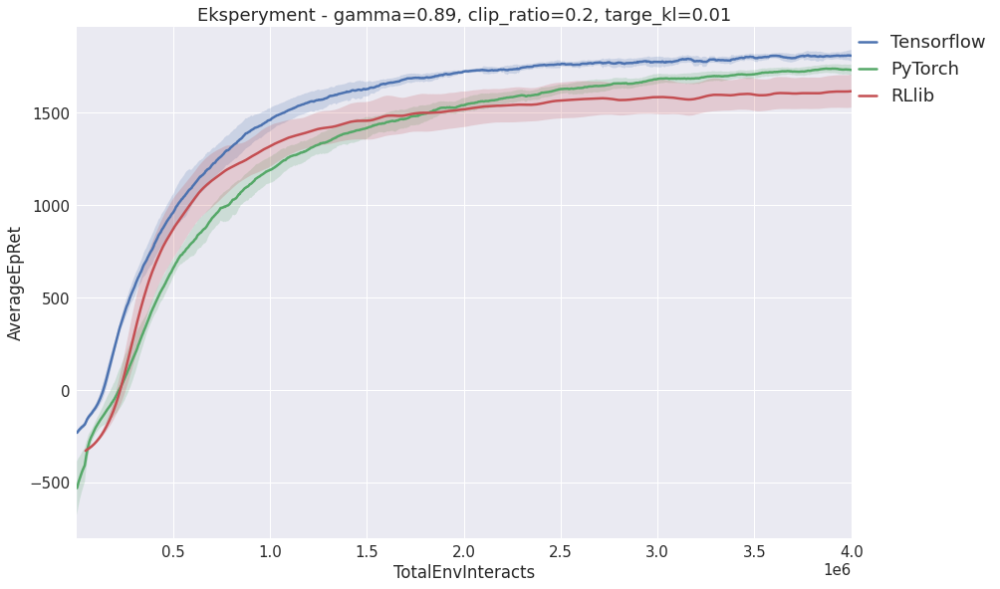

No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json


/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


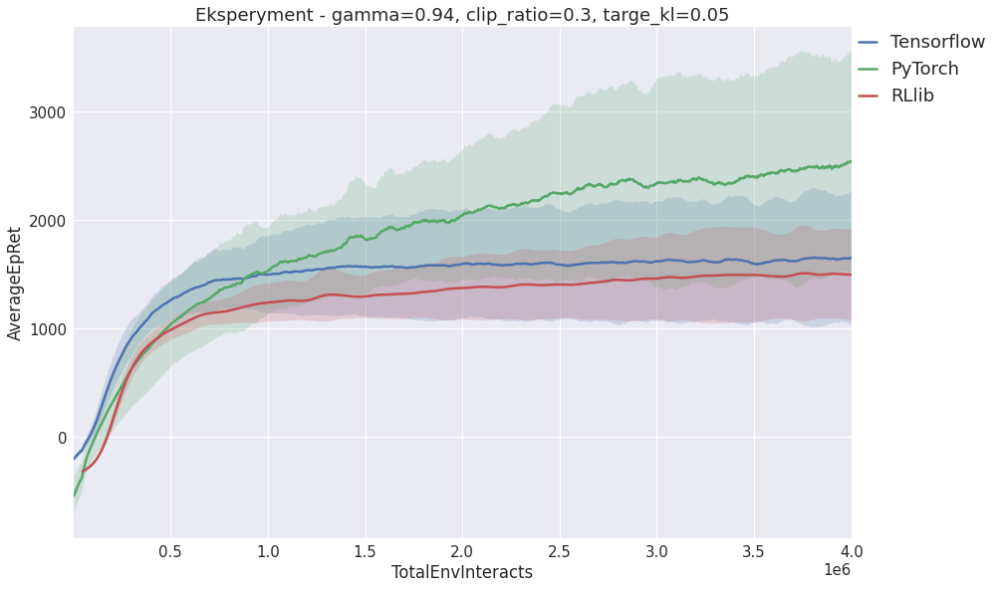

No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json


/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


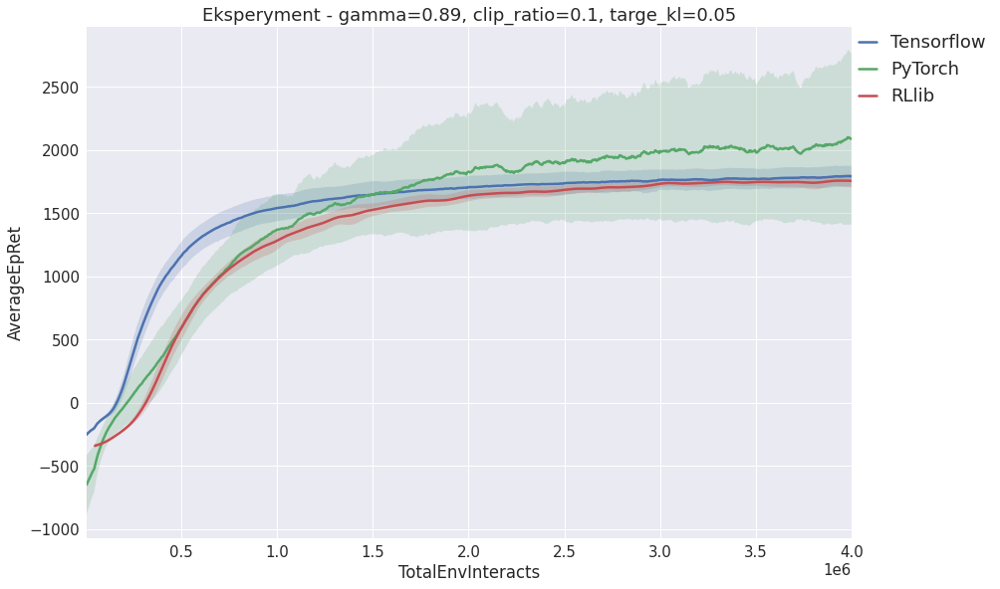

No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json


/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


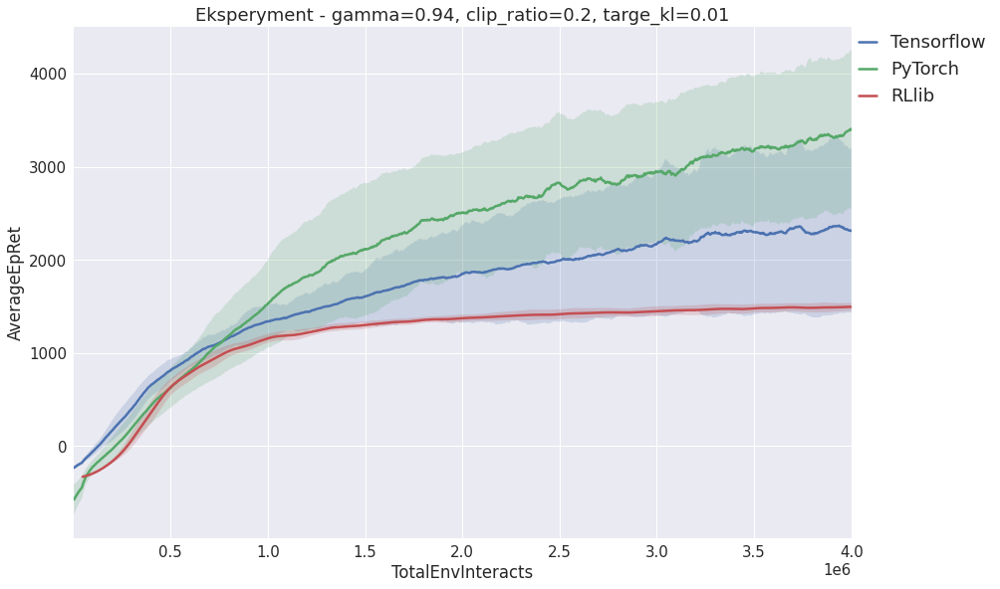

No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json


/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


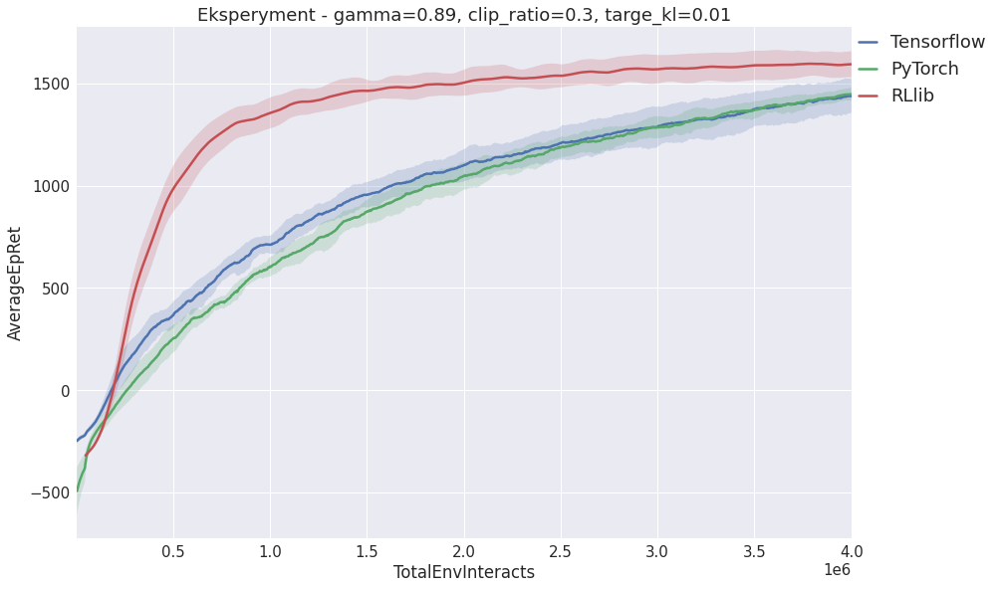

No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json


/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


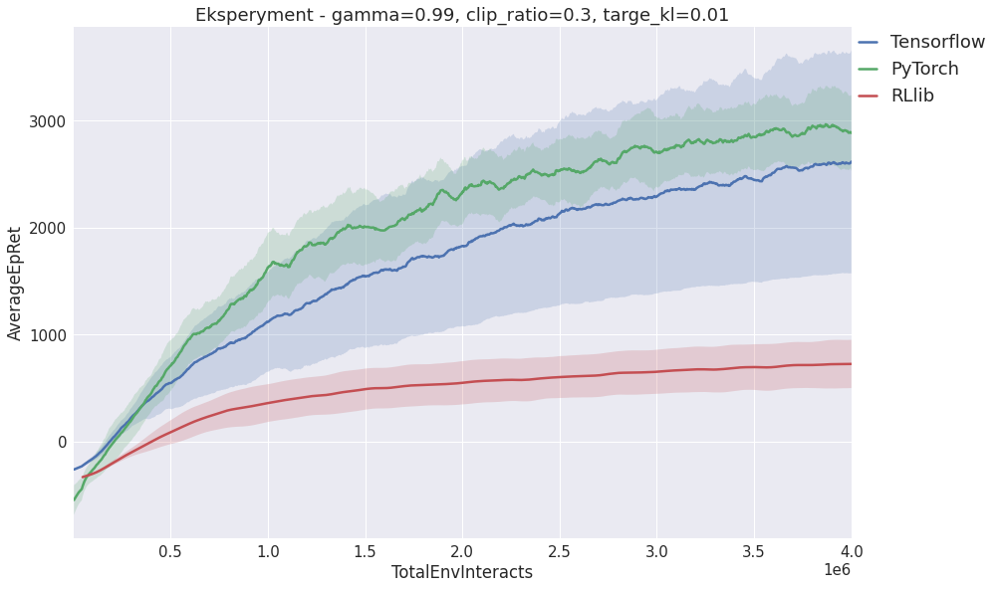

No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json


/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


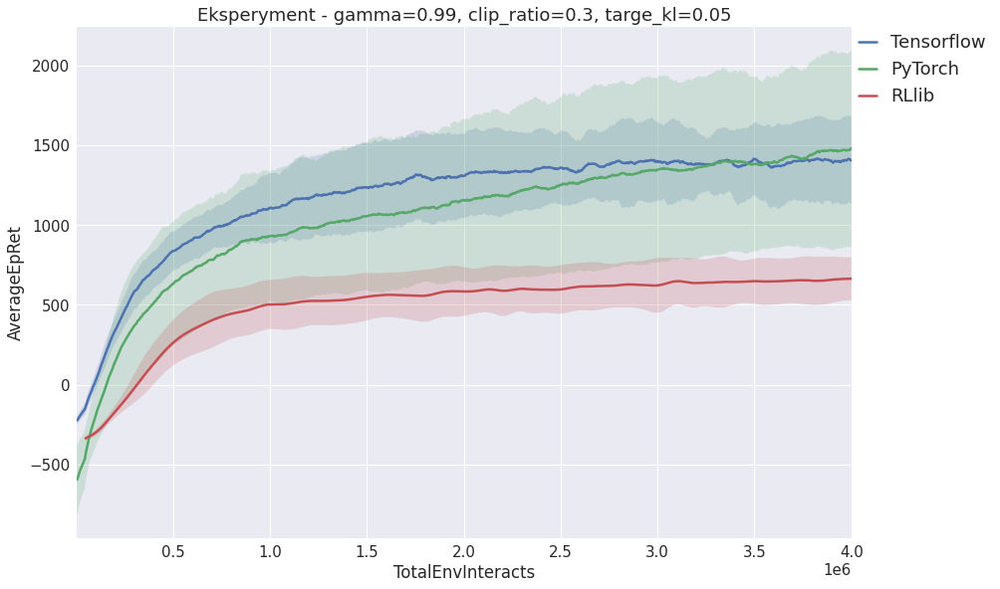

No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json


/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


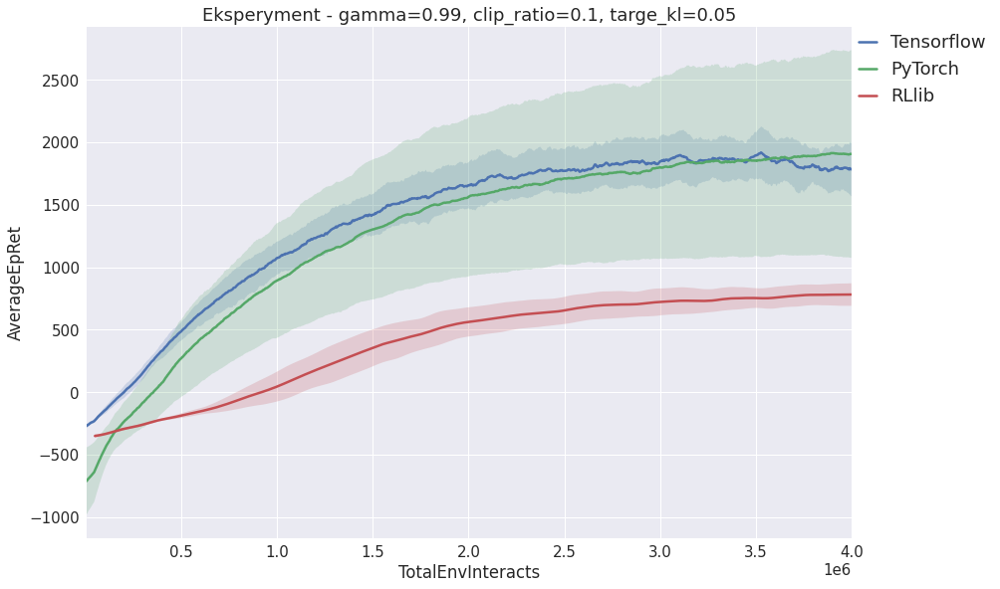

No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json


/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


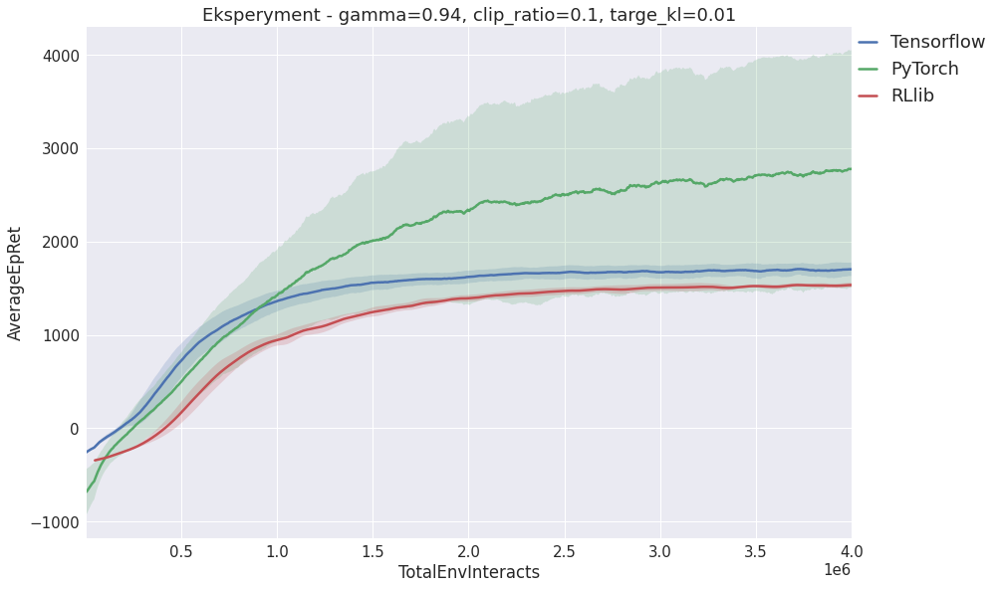

No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json


/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


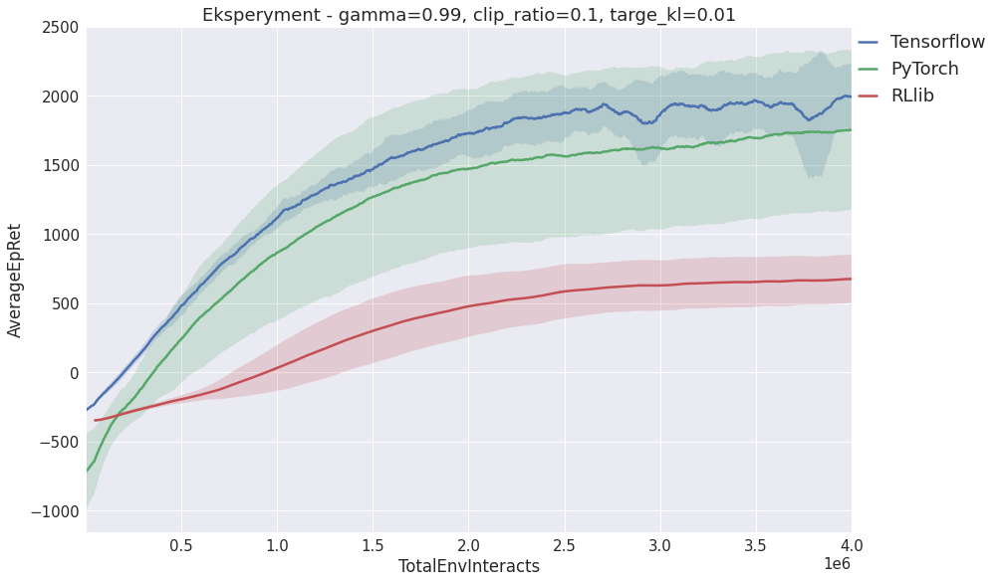

No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json
No file named config.json


/home/artur/documents/weiti/usd/usd-ppo/usd-ppo/lib/python3.8/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


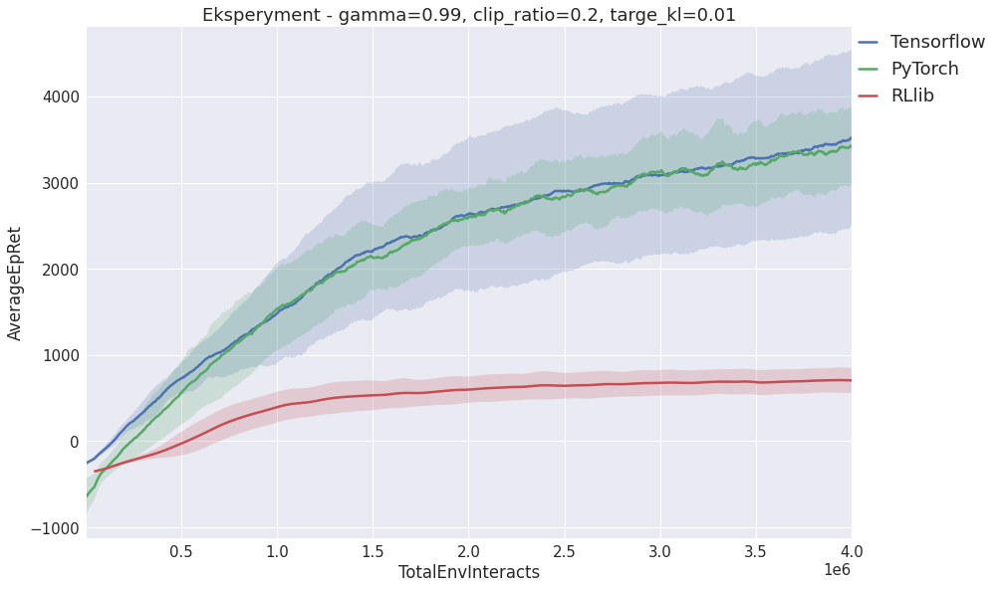

In [14]:
unique_experiments_names = set([experiment.split('halfcheetah-v2_')[1] for experiment in all_experiments if experiment != 'rllib'])

for experiment_name in unique_experiments_names:
    plot_experiment(experiment_name)